In [1]:
import os, json
import pandas as pd
from nltk import word_tokenize, pos_tag_sents
from langdetect import detect
import regex as re
import numpy as np
from nltk.corpus import stopwords
import pickle
#!pip install langdetect

In [2]:
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
print(__version__) # requires version >= 1.9.0


4.5.0


In [3]:
# For Notebooks
init_notebook_mode(connected=True)
# For offline use
cf.go_offline()
%matplotlib inline

### In this Notebook i've done the following :
___
​
​
    1. loaded the the pickled dataframes json_data_de and json_data_en
    
    2. Added a word count column and detected some outliers and cleaned them. 
       
    3. Plotted the Word count distribution using plotty
       
    4. vectorized the documents with TF-IDF
    
    5. Plotted the most important words according to TF-IDF scores using a plotty horizontal barplot
    
    6. Applied NMF (non negatif matrix factorization) on both german and english data and Discovered the most comon topics
    
    7. Added a topic column that maps every documents to a topic 
    
    8. Plotted the topics distribution using plotty
    
    9. Done the same 3 previous steps but this time using LDA 
    
    10. Trained a Wordvector on the endocs using gensim and got the word embeddings 
    
    11. Using TSNE i passed from the embedding space to a 2D space 
    
    12. Plotted the words that are discovered in the topics for the applied LDA on the english docs 
    
​
___
​
​
​

### <Center>Loading the serialized dataframes</center> 

In [4]:
with open('jsons_data_en.pickle','rb') as f:
    jsons_data_en=pickle.load(f)

In [5]:
jsons_data_en

,DATE,TEXT,FOLDER,FILE NAME,Processed TEXT,lang
0,19.05.2005,Pressenotiz ... Deutsche Bundesbank Ł Ext...,Pressenotizen,pressenotizen_19_05_2005_1747.json,pressenotiz deutsche bundesbank ł externe komm...,en
1,20.02.1999,Communiqué of G-7 Finance Ministers and Centra...,Pressenotizen,pressenotizen_20_02_1999_2125.json,communiqué finance ministers central bank gove...,en
2,25.05.1999,Deutsche BundesbankPressenotizPress release___...,Pressenotizen,pressenotizen_25_05_1999_2111.json,deutsche bundesbankpressenotizpress release___...,en
3,01.02.2008,Page 1 of 12 \n Deutsche Bundesbank Ł Communic...,Reden,reden_01_02_2008_790.json,page deutsche bundesbank ł communications depa...,en
4,01.03.2017,Current Developments in the Euro Area\n\nSpeec...,Reden,reden_01_03_2017_258.json,current developments euro area speech bank slo...,en
5,02.02.2011,Reproduction permitted only if source is state...,Reden,reden_02_02_2011_633.json,reproduction permitted source stated dr andrea...,en
6,02.10.2015,Moving together - one year of European banking...,Reden,reden_02_10_2015_376.json,moving together one year european banking supe...,en
7,03.06.2005,"Sendesperrfrist: 03. Juni 2005, 09:30 Uhr MESZ...",Reden,reden_03_06_2005_866.json,sendesperrfrist juni uhr mesz professor dr axe...,en
8,03.06.2007,"Embargo: June 3, 2007, 3.45 pm CET\n Œ Check a...",Reden,reden_03_06_2007_813.json,embargo june pm cet œ check delivery œ page de...,en
9,03.11.2009,Œ Check against delivery Œ \nPage 1 of 8 Deut...,Reden,reden_03_11_2009_707.json,œ check delivery œ page deutsche bundesbank ł ...,en


In [12]:
with open('jsons_data_de.pickle','rb') as f:
    jsons_data_de=pickle.load(f)

In [13]:
jsons_data_de

,DATE,TEXT,FOLDER,FILE NAME,Processed TEXT,lang
0,02.10.2018,Die Bundesbank digitalisiert die Bankenaufsich...,Interviews,interviews_02_10_2018_13.json,bundesbank digitalisiert bankenaufsicht interv...,de
1,04.04.2019,„Europa sollte nicht nur zuschauen“\n\nIntervi...,Interviews,interviews_04_04_2019_8.json,europa zuschauen interview handelsblatt burkha...,de
2,04.11.2018,„Banken haben ausreichend Puffer“\n\nInterview...,Interviews,interviews_04_11_2018_12.json,banken ausreichend puffer interview frankfurte...,de
3,09.07.2019,„Banken müssen jetzt handeln“\n\nInterview in ...,Interviews,interviews_09_07_2019_3.json,banken müssen handeln interview zeitschrift bö...,de
4,09.11.2018,Im Dienste ihrer Stabilität\n\nInterview mit d...,Interviews,interviews_09_11_2018_11.json,dienste stabilität interview euro finance maga...,de
5,10.09.2018,Wuermeling: Banken haben bei Sicherheit noch L...,Interviews,interviews_10_09_2018_17.json,wuermeling banken sicherheit luft oben intervi...,de
6,12.07.2019,„Die Aufsicht muss ein Auge auf Libra haben“\n...,Interviews,interviews_12_07_2019_2.json,aufsicht auge libra interview börsen zeitung b...,de
7,13.05.2019,„Minuszinsen sind nur ein Teil der Probleme“\n...,Interviews,interviews_13_05_2019_6.json,minuszinsen teil probleme interview handelsbla...,de
8,13.11.2018,„Wir brauchen europäische Lösungen“\n\nIntervi...,Interviews,interviews_13_11_2018_10.json,brauchen europäische lösungen interview handel...,de
9,15.04.2019,Wieso verschwindet der Fünfhunderter?\n\nInter...,Interviews,interviews_15_04_2019_7.json,wieso verschwindet fünfhunderter interview fra...,de


<br> Let's check the maximum number of words </br>

In [277]:
jsons_data_de['num_words'].max()

238308

In [293]:
jsons_data_de['num_words'].argmax(axis=1)

C:\Users\amine\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:


The current behaviour of 'Series.argmax' is deprecated, use 'idxmax'
instead.
The behavior of 'argmax' will be corrected to return the positional
maximum in the future. For now, use 'series.values.argmax' or
'np.argmax(np.array(values))' to get the position of the maximum
row.



216

In [276]:
jsons_data_de['FILE NAME'][216]

'monatsberichte_23_03_2015_7159.json'

<br> That's a big number of words !! probably there is a problem in the files or in parsing let's check all texts that have a sucpisous number of words </br>

In [285]:
# The mean number of words
jsons_data_de['num_words'].mean()

14999.318474067724

In [294]:
#The standard deviation 
jsons_data_de['num_words'].std()


42027.29983017703

In [297]:
#The median
jsons_data_de['num_words'].median()

518.0

                                                                                                                               That's a very big standard deviation 42027 words !!! Let's now isolate the files that are 20 times bigger than the median. We will deal with those outliers later

In [306]:
len(jsons_data_de['num_words'][jsons_data_de['num_words']>10000])

307

We have 307 docs that have over 10000 words ( more than 20 pages) Parsing problem certainly! They constitute 13% of the total files.

Let's now get the names of those files than drop them from the dataframe.

In [309]:
Droped_files=list(jsons_data_de['FILE NAME'][jsons_data_de['num_words']>10000])

Let's drop them now

In [311]:
jsons_data_de=jsons_data_de[jsons_data_de['num_words']<=10000]

In [312]:
jsons_data_de.shape

(2026, 9)

### <center> Word count visualization </center>

In [313]:
def descriptif(data) :   
    data['num_words'] = data['Processed TEXT'].apply(lambda x: len(x.split()))
    
descriptif(jsons_data_de) 
descriptif(jsons_data_en)

In [314]:
fig = px.histogram(jsons_data_en, x="num_words",
                   marginal="box",
                   hover_data=jsons_data_en.columns, title={
        'text': "English Docs",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

###### We can see bellow that we still have some outliers, we will keep them for the analysis

In [315]:
fig = px.histogram(jsons_data_de, x="num_words",
                   marginal="box",
                    title={
        'text': "German Docs Distplot",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

### <center> TF-IDF Vectorization </center>

In [316]:
from sklearn.feature_extraction.text import TfidfVectorizer
def TF_IDF(data):   
    tfidf = TfidfVectorizer(max_df=0.95, min_df=2)
    dtm=tfidf.fit_transform(data['Processed TEXT'])
    return tfidf,dtm

In [317]:
vectorizer_en,dtm_en=TF_IDF(jsons_data_en)

In [318]:
vectorizer_de,dtm_de=TF_IDF(jsons_data_de)

In [319]:
print(f"we have a vocab of {len(vectorizer_en.vocabulary_) } unique words for english files")
print(f"Shape of the english document term matrix {dtm_en.todense().shape}")

we have a vocab of 9383 unique words for english files
Shape of the english document term matrix (193, 9383)


In [320]:
print(f"we have a vocab of {len(vectorizer_de.vocabulary_) } unique words for german files")
print(f"Shape of the german document term matrix {dtm_de.todense().shape}")

we have a vocab of 43318 unique words for german files
Shape of the german document term matrix (2026, 43318)


### <center> Now let's see the top words by TF_IDF scores </center>

In [321]:
tf_idf_score_en=pd.DataFrame(dtm_en.toarray().sum(axis=0),index= vectorizer_en.get_feature_names()).sort_values(by=0)
#tf_idf_score_en[-1:-25:-1]

In [322]:
tf_idf_score_en[-30:-1:1].iplot(kind='barh',xTitle = 'TF_IDF score',yTitle='Term',title={
        'text': "TF IDF SCORES EN",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

In [323]:
tf_idf_score_de=pd.DataFrame(dtm_de.toarray().sum(axis=0),index= vectorizer_de.get_feature_names()).sort_values(by=0,ascending=True)
#tf_idf_score_de[-1:-25:-1]

In [324]:
tf_idf_score_de[-30:-1:1].iplot(kind='barh',xTitle ='TF_IDF score',yTitle= 'Term',title={
        'text': "TF IDF SCORES DE",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

### <center>Topic modeling using non negatif matrix factorization </center>

In [325]:
from sklearn.decomposition import NMF

In [326]:
def get_topics(dtm,vectorizer,ntopics=7,nwords=15):
    nmf_model= NMF(n_components=ntopics)
    nmf_model.fit(dtm)
    for index,topic in enumerate(nmf_model.components_):
        print(f'THE TOP {nwords} WORDS FOR TOPIC #{index}')
        print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-15:]])
        print('\n')
    return nmf_model

### <center>Top Words for Topics</center>

### English docs topics

In [327]:
nmf_model_en=get_topics(dtm_en,vectorizer_en,ntopics=3,nwords=10)

THE TOP 10 WORDS FOR TOPIC #0
['page', 'de', 'strasse', 'source', 'mail', 'wilhelm', 'presse', 'fax', 'tel', 'department', 'stated', 'communications', 'permitted', 'reproduction', 'bundesbank']


THE TOP 10 WORDS FOR TOPIC #1
['regulatory', 'global', 'institutions', 'international', 'system', 'european', 'crisis', 'market', 'basel', 'capital', 'data', 'risk', 'banking', 'banks', 'financial']


THE TOP 10 WORDS FOR TOPIC #2
['stability', 'market', 'term', 'interest', 'rates', 'economic', 'rate', 'eurosystem', 'central', 'area', 'price', 'euro', 'inflation', 'policy', 'monetary']




### German Docs topics

In [328]:
nmf_model_de=get_topics(dtm_de,vectorizer_de,ntopics=4,nwords=10)

THE TOP 10 WORDS FOR TOPIC #0
['berichtsmonat', 'wurden', 'ergebnis', 'anleihen', 'ausland', 'inländische', 'vormonat', 'aktien', 'höhe', 'ausländische', 'per', 'schuldverschreibungen', 'saldo', 'netto', 'mrd']


THE TOP 10 WORDS FOR TOPIC #1
['ezb', 'bundesbank', 'raum', 'europäischen', 'deutschland', 'jahr', 'risiken', 'institute', 'krise', 'mehr', 'müssen', 'währungsunion', 'geldpolitik', 'euro', 'banken']


THE TOP 10 WORDS FOR TOPIC #2
['verwertung', 'wilhelm', 'publizistischer', 'mail', 'straße', 'epstein', 'kommunikation', 'frankfurt', 'tel', 'de', 'gebeten', 'fax', 'information', 'presse', 'bundesbank']


THE TOP 10 WORDS FOR TOPIC #3
['prozentpunkte', 'gefallen', 'festzinssatz', 'gesetzbuchs', 'jüngste', 'januar', 'juli', 'zinssatz', 'abs', 'bezugsgröße', 'bürgerlichen', 'bgb', 'hauptrefinanzierungsoperation', 'basiszinssatzes', 'basiszinssatz']




### <center> Lets attach the discovered Topic Labels to the Original documents</center>

In [329]:
def append_topic(nmf_model,dtm,data,col_name='Topic'):
    topic_results = nmf_model.transform(dtm)
    data[col_name]=topic_results.argmax(axis=1)

In [330]:
append_topic(nmf_model_en,dtm_en,jsons_data_en)
jsons_data_en.head(5)

,DATE,TEXT,FOLDER,FILE NAME,Processed TEXT,lang,num_words,Topic,Topic LDA
0,19.05.2005,Pressenotiz ... Deutsche Bundesbank Ł Ext...,Pressenotizen,pressenotizen_19_05_2005_1747.json,pressenotiz deutsche bundesbank ł externe komm...,en,777,2,1
1,20.02.1999,Communiqué of G-7 Finance Ministers and Centra...,Pressenotizen,pressenotizen_20_02_1999_2125.json,communiqué finance ministers central bank gove...,en,1991,1,1
2,25.05.1999,Deutsche BundesbankPressenotizPress release___...,Pressenotizen,pressenotizen_25_05_1999_2111.json,deutsche bundesbankpressenotizpress release___...,en,61,0,1
3,01.02.2008,Page 1 of 12 \n Deutsche Bundesbank Ł Communic...,Reden,reden_01_02_2008_790.json,page deutsche bundesbank ł communications depa...,en,1950,0,1
4,01.03.2017,Current Developments in the Euro Area\n\nSpeec...,Reden,reden_01_03_2017_258.json,current developments euro area speech bank slo...,en,3088,2,1


In [331]:
jsons_data_en['Topic'].value_counts().iplot(kind='barh',xTitle ='counts',yTitle= 'topic number',title={
        'text': "Tpoics for english docs",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

In [332]:
append_topic(nmf_model_de,dtm_de,jsons_data_de)
jsons_data_de.head(5)

,DATE,TEXT,FOLDER,FILE NAME,Processed TEXT,lang,num_words,Topic,Topic LDA
0,02.10.2018,Die Bundesbank digitalisiert die Bankenaufsich...,Interviews,interviews_02_10_2018_13.json,bundesbank digitalisiert bankenaufsicht interv...,de,1289,1,0
1,04.04.2019,„Europa sollte nicht nur zuschauen“\n\nIntervi...,Interviews,interviews_04_04_2019_8.json,europa zuschauen interview handelsblatt burkha...,de,789,1,0
2,04.11.2018,„Banken haben ausreichend Puffer“\n\nInterview...,Interviews,interviews_04_11_2018_12.json,banken ausreichend puffer interview frankfurte...,de,237,1,0
3,09.07.2019,„Banken müssen jetzt handeln“\n\nInterview in ...,Interviews,interviews_09_07_2019_3.json,banken müssen handeln interview zeitschrift bö...,de,757,1,0
4,09.11.2018,Im Dienste ihrer Stabilität\n\nInterview mit d...,Interviews,interviews_09_11_2018_11.json,dienste stabilität interview euro finance maga...,de,829,1,0


In [333]:
jsons_data_de['Topic'].value_counts().iplot(kind='barh',xTitle ='counts',yTitle= 'topic number',title={
        'text': "Tpoics for german docs",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

### <center>Topic modeling using Latent dirichlet alocation </center>

In [334]:
from sklearn.decomposition import LatentDirichletAllocation

In [335]:
def get_topics(dtm,vectorizer,ntopics=7,nwords=15):
    lda_model= LatentDirichletAllocation(n_components=ntopics)
    lda_model.fit(dtm)
    for index,topic in enumerate(lda_model.components_):
        print(f'THE TOP {nwords} WORDS FOR TOPIC #{index}')
        print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-15:]])
        print('\n')
    return lda_model

### <center>Top Words for Topics</center>

### English docs topics

In [336]:
lda_model_en=get_topics(dtm_en,vectorizer_en,ntopics=3,nwords=10)

THE TOP 10 WORDS FOR TOPIC #0
['permitted', 'reproduction', 'central', 'page', 'germany', 'stability', 'economic', 'euro', 'market', 'crisis', 'banks', 'monetary', 'bundesbank', 'policy', 'financial']


THE TOP 10 WORDS FOR TOPIC #1
['internatio', 'crisisﬂ', 'heute', 'delivered', 'roundtable', 'preconditions', 'thema', 'seinen', 'zum', 'discovering', 'ssons', 'ludwig', 'omfif', 'carl', 'thiele']


THE TOP 10 WORDS FOR TOPIC #2
['internatio', 'crisisﬂ', 'heute', 'delivered', 'roundtable', 'preconditions', 'seinen', 'thema', 'zum', 'discovering', 'ssons', 'ludwig', 'omfif', 'carl', 'thiele']




In [337]:
append_topic(lda_model_en,dtm_en,jsons_data_en,col_name='Topic LDA')
jsons_data_en.head(5)

,DATE,TEXT,FOLDER,FILE NAME,Processed TEXT,lang,num_words,Topic,Topic LDA
0,19.05.2005,Pressenotiz ... Deutsche Bundesbank Ł Ext...,Pressenotizen,pressenotizen_19_05_2005_1747.json,pressenotiz deutsche bundesbank ł externe komm...,en,777,2,0
1,20.02.1999,Communiqué of G-7 Finance Ministers and Centra...,Pressenotizen,pressenotizen_20_02_1999_2125.json,communiqué finance ministers central bank gove...,en,1991,1,0
2,25.05.1999,Deutsche BundesbankPressenotizPress release___...,Pressenotizen,pressenotizen_25_05_1999_2111.json,deutsche bundesbankpressenotizpress release___...,en,61,0,0
3,01.02.2008,Page 1 of 12 \n Deutsche Bundesbank Ł Communic...,Reden,reden_01_02_2008_790.json,page deutsche bundesbank ł communications depa...,en,1950,0,0
4,01.03.2017,Current Developments in the Euro Area\n\nSpeec...,Reden,reden_01_03_2017_258.json,current developments euro area speech bank slo...,en,3088,2,0


In [338]:
jsons_data_en['Topic LDA'].value_counts().iplot(kind='barh',xTitle ='counts',yTitle= 'topic number',title={
        'text': "Tpoics for english docs",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

### German docs topics

In [339]:
lda_model_de=get_topics(dtm_de,vectorizer_de,ntopics=4,nwords=10)

THE TOP 10 WORDS FOR TOPIC #0
['bundesanzeigers', 'festzinssatz', 'bundesanzeiger', 'januar', 'gesetzbuchs', 'juli', 'jüngste', 'zinssatz', 'abs', 'bürgerlichen', 'bezugsgröße', 'bgb', 'hauptrefinanzierungsoperation', 'basiszinssatzes', 'basiszinssatz']


THE TOP 10 WORDS FOR TOPIC #1
['ergebnis', 'wurden', 'direktinvestitionen', 'anleihen', 'inländische', 'vormonat', 'höhe', 'aktien', 'ausland', 'ausländische', 'per', 'schuldverschreibungen', 'saldo', 'netto', 'mrd']


THE TOP 10 WORDS FOR TOPIC #2
['information', 'institute', 'seite', 'main', 'de', 'geldpolitik', 'deutschland', 'presse', 'jahr', 'deutschen', 'frankfurt', 'deutsche', 'euro', 'banken', 'bundesbank']


THE TOP 10 WORDS FOR TOPIC #3
['derivateumsätze', 'bundeswertpapiere', 'begrüßungsrede', 'bundeswertpapieren', 'ces', 'devisenhandelsumsätze', 'bain', 'absatz', 'quotenerhöhung', 'ressortverteilung', 'konsortial', 'bubillsﬁ', 'bildschirmseiten', 'anhörungen', 'bundesrats']




In [340]:
append_topic(lda_model_de,dtm_de,jsons_data_de,col_name='Topic LDA')
jsons_data_de.head(5)

,DATE,TEXT,FOLDER,FILE NAME,Processed TEXT,lang,num_words,Topic,Topic LDA
0,02.10.2018,Die Bundesbank digitalisiert die Bankenaufsich...,Interviews,interviews_02_10_2018_13.json,bundesbank digitalisiert bankenaufsicht interv...,de,1289,1,2
1,04.04.2019,„Europa sollte nicht nur zuschauen“\n\nIntervi...,Interviews,interviews_04_04_2019_8.json,europa zuschauen interview handelsblatt burkha...,de,789,1,2
2,04.11.2018,„Banken haben ausreichend Puffer“\n\nInterview...,Interviews,interviews_04_11_2018_12.json,banken ausreichend puffer interview frankfurte...,de,237,1,2
3,09.07.2019,„Banken müssen jetzt handeln“\n\nInterview in ...,Interviews,interviews_09_07_2019_3.json,banken müssen handeln interview zeitschrift bö...,de,757,1,2
4,09.11.2018,Im Dienste ihrer Stabilität\n\nInterview mit d...,Interviews,interviews_09_11_2018_11.json,dienste stabilität interview euro finance maga...,de,829,1,2


In [259]:
jsons_data_de['Topic LDA'].value_counts().iplot(kind='barh',xTitle ='counts',yTitle= 'topic number',title={
        'text': "Tpoics for german docs",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

### <center> We want to use the Word2vec embedding and represent our topics in a 2d manifold using TSNE </center>

In [435]:
import re
import multiprocessing
from gensim.models import Word2Vec
from gensim.models.word2vec import LineSentence
from sklearn.manifold import TSNE
import numpy as np
from nltk import sent_tokenize,word_tokenize
import spacy

In [453]:
def preprocess_text(text):
    text=text.lower()
    text = re.sub('[^a-zA-Zа-яА-Я1-9]+', ' ', text)
    text = re.sub(' +', ' ', text)
    return text.strip()
 
def join_txts(dataframe):
    raw_txt=''
    for x in dataframe :
        raw_txt+=x
    return raw_txt

def prepare_for_w2v(raw_text, lang):
    return list(map(preprocess_text,sent_tokenize(raw_text)))

In [456]:
def train_word2vec(sent):
    return Word2Vec(sentences= sent, size=200, window=5, min_count=5, workers=multiprocessing.cpu_count())

In [373]:
raw_text_en=join_txts(jsons_data_en['TEXT'])

In [454]:
processed_txt_en=prepare_for_w2v(raw_text_en,lang='english')

In [493]:
model_ak_en = train_word2vec([word_tokenize(x) for x in list(map(preprocess_text,sent_tokenize(raw_text_en)))])

In [494]:
model_ak_en.wv.vectors.shape

(5960, 200)

### Lets now extract the trained word vectors for some words in comon topics from english docs lda results

In [508]:
words_ak_en = []
embeddings_ak_en = []
topics=['permitted', 'reproduction', 'central', 'page', 'germany', 'stability', 'economic', 'euro', 'market', 'crisis', 'banks', 'monetary', 'bundesbank', 'policy', 'financial','international', 'heute', 'delivered', 'roundtable', 'ludwig', 'carl']

for word in topics:
    embeddings_ak_en.append(model_ak_en.wv[word])
    words_ak_en.append(word)

### TSNE Model

In [511]:
tsne_ak_2d = TSNE(perplexity=30, n_components=2, init='pca', n_iter=3500, random_state=32)
embeddings_ak_2d = tsne_ak_2d.fit_transform(embeddings_ak_en)

###  Vizualisation and 2d Plot !

In [523]:
import matplotlib.cm as cm
def tsne_plot_2d(label, embeddings, words=[], a=1):
    plt.figure(figsize=(16, 9))
    colors = cm.rainbow(np.linspace(0, 1, 1))
    x = embeddings[:,0]
    y = embeddings[:,1]
    plt.scatter(x, y, c=colors, alpha=a, label=label)
    for i, word in enumerate(words):
        plt.annotate(word, alpha=0.8, xy=(x[i], y[i]), xytext=(5, 2), 
                     textcoords='offset points', ha='right', va='bottom', size=10)
    plt.legend(loc=4)
    plt.grid(True)
    plt.savefig("hhh.png", format='png', dpi=150, bbox_inches='tight')
    plt.show()


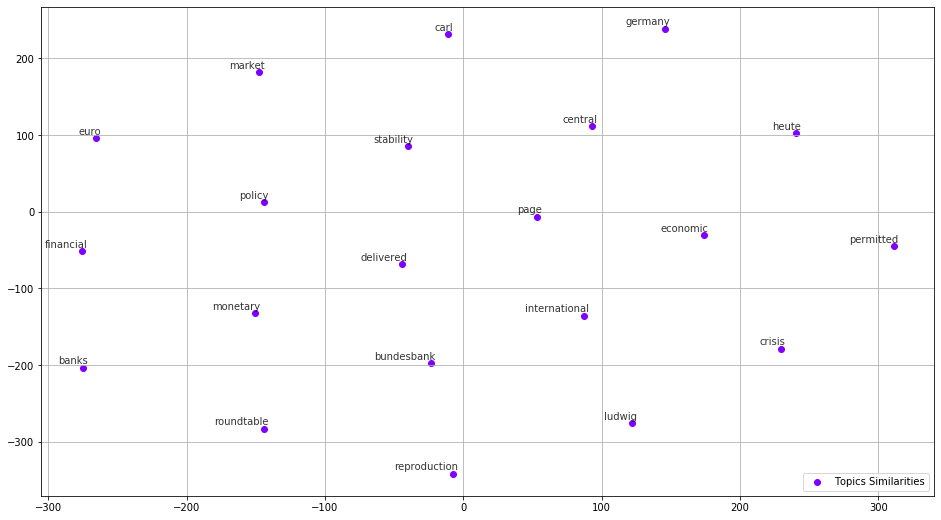

In [524]:
tsne_plot_2d('Topics Similarities', embeddings_ak_2d,words=topics, a=1)


In [ ]:
! jt -t 